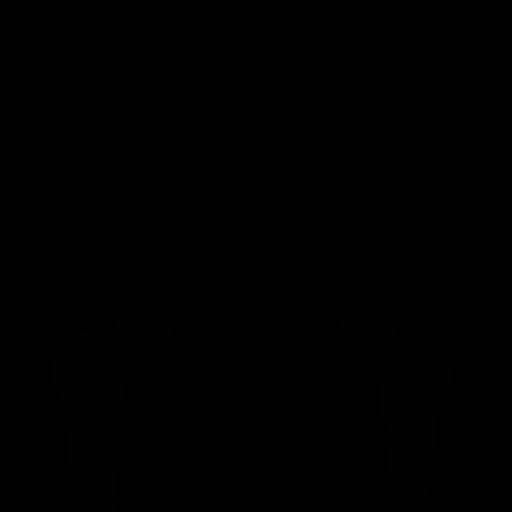

In [418]:
img = Image.open("/home/ctpel/xray/pr_femur_eb3/9004905.png")

In [419]:
img = Image.open("/home/ctpel/xray/pr_femur_eb3/9004905.png")

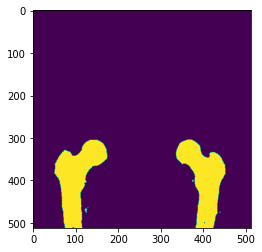

In [420]:
plt.imshow(np.array(img))

In [421]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset
from glob import glob

In [422]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

In [423]:
class Dataset(BaseDataset):
    """CamVid Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    
    """
    
#     CLASSES = ['RightFemur', 'LeftFemur', 'RightHip', 'LeftHip', 'Sacrum']
    CLASSES = ['RightFemur', 'LeftFemur', 'RightHip', 'LeftHip', 'Sacrum']
    
    def __init__(
            self,
            csv_path,
            images_dir, 
            masks_dir,
            classes=None, 
            augmentation=None, 
            preprocessing=None,
            mode='train'
    ):
        self.mode = mode
        if self.mode != 'xray':
            self.csv = pd.read_csv(csv_path).values
            pos = self.csv[:, -1] == self.mode
            self.csv = self.csv[pos]
            self.imgs_lst = [os.path.join(images_dir, f"{x}_drr.png") for x in self.csv[:, 0]]
            self.masks_lst = [os.path.join(masks_dir, f"{x}_mask.png") for x in self.csv[:, 0]]

            # convert str names to class values on masks
            self.class_values = [self.CLASSES.index(cls) for cls in classes]
        else:
            self.imgs_lst = glob(f"{images_dir}/*png")
        
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, idx):
        
        # read data
        if self.mode != 'xray':
            image = np.array(Image.open(self.imgs_lst[idx]).convert("RGB"))
            masks = [self.masks_lst[idx].replace("_mask", f"_{x}") for x in range(1, len(self.class_values)+1)]
            masks = [np.array(Image.open(x).convert("L")) for x in masks]
            # background
    #         foreground = np.stack(masks, axis=-1).astype('float')
    #         background = np.sum(foreground, axis=2) != 255
    #         masks += [background*255]

            # extract certain classes from mask (e.g. cars)
            mask = np.stack(masks, axis=-1).astype('float')
            mask = np.where(mask==255, 1, 0)
        else:
            image = np.array(Image.open(self.imgs_lst[idx]).convert("RGB").resize((512, 512)))
            mask = np.zeros(image.shape)
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        return len(self.imgs_lst)

In [424]:
csv_path = "/home/ctpel/ctpel_split.csv"
img_dir = "/home/ctpel/ctpel_drr/drr"
mask_dir = "/home/ctpel/ctpel_drr/mask"

In [425]:
import albumentations as albu

In [426]:
def get_training_augmentation():
    train_transform = [

#         albu.HorizontalFlip(p=0.5),

        albu.ShiftScaleRotate(scale_limit=0.05, rotate_limit=0.05, shift_limit=0.05, p=0.5, border_mode=0),

        albu.augmentations.transforms.GaussNoise(p=0.2),
        albu.augmentations.geometric.transforms.Perspective(p=0.5),

        albu.OneOf(
            [
                albu.CLAHE(p=1),
                albu.RandomBrightness(p=1),
                albu.RandomGamma(p=1),
            ],
            p=0.5,
        ),

        albu.OneOf(
            [
                albu.augmentations.transforms.Sharpen(p=1),
                albu.Blur(blur_limit=3, p=1),
                albu.MotionBlur(blur_limit=3, p=1),
            ],
            p=0.5,
        ),

        albu.OneOf(
            [
                albu.RandomContrast(p=1),
                albu.HueSaturationValue(p=1),
            ],
            p=0.5,
        ),
    ]
    return albu.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
    ]
    return albu.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform
    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    
    """
    
    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

In [427]:
import torch
import numpy as np
import segmentation_models_pytorch as smp

In [429]:
ENCODER = 'efficientnet-b3'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['RightFemur', 'LeftFemur', 'RightHip', 'LeftHip', 'Sacrum']
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multiclass segmentation
DEVICE = 'cuda'

# create segmentation model with pretrained encoder
model = smp.DeepLabV3Plus(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

In [430]:
# Dice/F1 score - https://en.wikipedia.org/wiki/S%C3%B8rensen%E2%80%93Dice_coefficient
# IoU/Jaccard score - https://en.wikipedia.org/wiki/Jaccard_index

loss = smp.utils.losses.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
    smp.utils.metrics.Fscore(threshold=0.5),
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.005),
])

In [431]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [432]:
# load best saved checkpoint
best_model = torch.load('./best_model_eb3.pth')

In [433]:
# create test dataset
test_dataset = Dataset(
    csv_path,
    img_dir, 
    mask_dir,  
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    classes=CLASSES,
    mode= 'test'
)

test_dataloader = DataLoader(test_dataset)

In [434]:
# evaluate model on test set
test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
)

logs = test_epoch.run(test_dataloader)

valid: 100%|██████████| 10/10 [00:00<00:00, 13.03it/s, dice_loss - 0.02952, iou_score - 0.9447, fscore - 0.9715]


In [435]:
# create test dataset
xray_dataset = Dataset(
    csv_path,
    "xray/png_512", 
    mask_dir,  
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    classes=CLASSES,
    mode= 'xray'
)

xray_dataloader = DataLoader(xray_dataset)

In [436]:
# create test dataset
xray_dataset_vis = Dataset(
    csv_path,
    "xray/png_512", 
    mask_dir,  
    classes=CLASSES,
    mode= 'xray'
)

In [391]:
xray_dataset.imgs_lst[i]

'xray/png_512/9048789.png'

In [ ]:
Imane.open()

In [35]:
femur = np.array(pr_mask[0]+pr_mask[1]).astype('uint8')

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [122]:
!mkdir xray/pr_all
!mkdir xray/pr_all_eb0
!mkdir xray/pr_all_teb0
!mkdir xray/pr_all_teb3

In [121]:
!rm -rf xray/pr_all
!rm -rf xray/pr_all_eb0
!rm -rf xray/pr_all_teb0
!rm -rf xray/pr_all_teb3

In [392]:
image, gt_mask = xray_dataset[0]

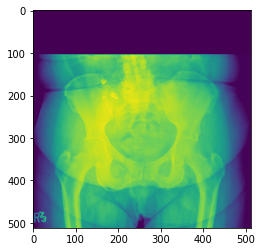

In [396]:
plt.imshow(image[0])

In [400]:
gt_mask.shape

(3, 512, 512)

In [402]:
np.max(gt_mask)

0.0

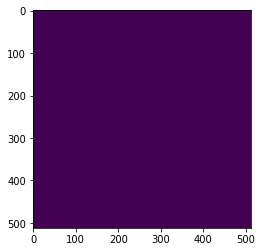

In [401]:
plt.imshow(gt_mask[2])

In [394]:
gt_mask

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]], dtype=float32)

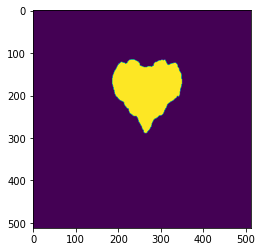

In [410]:
plt.imshow(pr_mask[4])

In [437]:
for i in tqdm(range(len(xray_dataset))):
    n = i
    
    image_vis = xray_dataset_vis[n][0].astype('uint8')
    image, gt_mask = xray_dataset[n]
    
    
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = best_model.predict(x_tensor)
    pr_mask = (pr_mask.squeeze().cpu().numpy().round())
    
    for idx in range(5):
        Image.fromarray(pr_mask[idx].astype('uint8')).save(xray_dataset.imgs_lst[i].replace("png_512", "pr_all_eb0").replace(".png", f"_{idx+1}.png"))
    
    femur = np.array(pr_mask[0]+pr_mask[1])
    break
    Image.fromarray(np.where(femur !=0, 1, 0).astype('uint8')).save(xray_dataset.imgs_lst[i].replace("png_512", "pr_femur_eb0"))
        
#     visualize(
#         image=image_vis, 
#         ground_truth_mask= np.sum(gt_mask, axis=0), 
#         predicted_mask= np.sum(pr_mask, axis=0)
#     )

  0%|          | 0/173 [00:00<?, ?it/s]


In [413]:
arr = np.array(Image.open("/home/ctpel/xray/pr_all_eb0/9021102_1.png"))

In [414]:
np.max(arr)

1

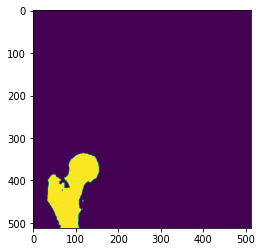

In [416]:
plt.imshow(arr)

In [76]:
len(png_lst)

173

In [67]:
non = []
for i in range(len(xray_dataset)):
    mask = np.array(Image.open(mask_lst[i]))
    if np.sum(mask) == 0:
        non.append(mask_lst[i])

In [71]:
import os

In [180]:
for n in non:
    os.remove(n)
    os.remove(n.replace("mask_512", "png_512").replace("_mask.png", ".png"))
    os.remove(n.replace("mask_512", "pr_femur_eb0").replace("_mask.png", ".png"))
    os.remove(n.replace("mask_512", "pr_femur_eb3").replace("_mask.png", ".png"))
    os.remove(n.replace("mask_512", "pr_femur_teb0").replace("_mask.png", ".png"))
    os.remove(n.replace("mask_512", "pr_femur_teb3").replace("_mask.png", ".png"))

In [361]:
png_lst = sorted(glob("xray/png_512/*png"))
mask_lst = sorted(glob("xray/mask_512/*png"))
pr0_lst = sorted(glob("xray/pr_femur_eb0/*png"))
pr1_lst = sorted(glob("xray/pr_femur_teb0/*png"))
pr2_lst = sorted(glob("xray/pr_femur_eb3/*png"))
pr3_lst = sorted(glob("xray/pr_femur_teb3/*png"))
pr4_lst = sorted(glob("xray/pr_femur_post/*png"))

TP_lst = []
FP_lst = []
FN_lst = []
GT_lst = []
PR_lst = []
for i in range(len(png_lst)):
    png = np.array(Image.open(png_lst[i]))
    mask = np.array(Image.open(mask_lst[i]))
    pr0 = np.array(Image.open(pr0_lst[i]))
    pr1 = np.array(Image.open(pr1_lst[i]))
    pr2 = np.array(Image.open(pr2_lst[i]))
    pr3 = np.array(Image.open(pr3_lst[i]))
    pr4 = np.array(Image.open(pr4_lst[i]))
    
    pr = pr4
        
#     pr = np.mean([pr2, pr3], axis=0)>0.5

    TP_lst.append(np.sum(np.where(pr == 1, mask, 0)))
    FP_lst.append(np.sum(np.where(pr != 1, mask, 0)))
    FN_lst.append(np.sum(np.where(mask != 1, pr, 0)))
    GT_lst.append(np.sum(mask))
    PR_lst.append(np.sum(pr))

TP = sum(TP_lst)
FP = sum(FP_lst)
FN = sum(FN_lst)
GT = sum(GT_lst)
PR = sum(PR_lst)

print("="*10)
print("total dice : ", round(2*TP/(2*TP+FP+FN), 4))
print("total iou  : ", round(TP/(GT+PR-TP), 4))

total dice :  0.9668
total iou  :  0.9358


In [305]:
pr2_lst[0].replace("pr_femur_eb3", "pr_femur_post")

'xray/pr_femur_post/9004905.png'

In [307]:
i = 0

In [439]:
png_lst = sorted(glob("/home/ctpel/xray/pr_all_eb3/*png"))

In [440]:
png_lst

['/home/ctpel/xray/pr_all_eb3/9004905_1.png',
 '/home/ctpel/xray/pr_all_eb3/9004905_2.png',
 '/home/ctpel/xray/pr_all_eb3/9004905_3.png',
 '/home/ctpel/xray/pr_all_eb3/9004905_4.png',
 '/home/ctpel/xray/pr_all_eb3/9004905_5.png',
 '/home/ctpel/xray/pr_all_eb3/9021102_1.png',
 '/home/ctpel/xray/pr_all_eb3/9021102_2.png',
 '/home/ctpel/xray/pr_all_eb3/9021102_3.png',
 '/home/ctpel/xray/pr_all_eb3/9021102_4.png',
 '/home/ctpel/xray/pr_all_eb3/9021102_5.png',
 '/home/ctpel/xray/pr_all_eb3/9021791_1.png',
 '/home/ctpel/xray/pr_all_eb3/9021791_2.png',
 '/home/ctpel/xray/pr_all_eb3/9021791_3.png',
 '/home/ctpel/xray/pr_all_eb3/9021791_4.png',
 '/home/ctpel/xray/pr_all_eb3/9021791_5.png',
 '/home/ctpel/xray/pr_all_eb3/9030718_1.png',
 '/home/ctpel/xray/pr_all_eb3/9030718_2.png',
 '/home/ctpel/xray/pr_all_eb3/9030718_3.png',
 '/home/ctpel/xray/pr_all_eb3/9030718_4.png',
 '/home/ctpel/xray/pr_all_eb3/9030718_5.png',
 '/home/ctpel/xray/pr_all_eb3/9041946_1.png',
 '/home/ctpel/xray/pr_all_eb3/9041

In [454]:
pr = np.array(Image.open(png_lst[3]))

In [466]:
png

'/home/ctpel/xray/pr_all_eb3/9004905_1.png'

In [472]:
!tar -cvf xray/test_5cls.tar xray/test_5cls

xray/test_5cls/
xray/test_5cls/9004905_1.png
xray/test_5cls/.ipynb_checkpoints/
xray/test_5cls/.ipynb_checkpoints/9004905_1-checkpoint.png
xray/test_5cls/.ipynb_checkpoints/9004905_2-checkpoint.png
xray/test_5cls/.ipynb_checkpoints/9004905_3-checkpoint.png
xray/test_5cls/.ipynb_checkpoints/9004905_4-checkpoint.png
xray/test_5cls/.ipynb_checkpoints/9004905_5-checkpoint.png
xray/test_5cls/.ipynb_checkpoints/9021102_1-checkpoint.png
xray/test_5cls/.ipynb_checkpoints/9021102_2-checkpoint.png
xray/test_5cls/.ipynb_checkpoints/9021102_3-checkpoint.png
xray/test_5cls/.ipynb_checkpoints/9021102_5-checkpoint.png
xray/test_5cls/.ipynb_checkpoints/9021791_1-checkpoint.png
xray/test_5cls/.ipynb_checkpoints/9021791_2-checkpoint.png
xray/test_5cls/.ipynb_checkpoints/9021791_3-checkpoint.png
xray/test_5cls/.ipynb_checkpoints/9021791_4-checkpoint.png
xray/test_5cls/9004905_2.png
xray/test_5cls/9004905_3.png
xray/test_5cls/9004905_4.png
xray/test_5cls/9004905_5.png
xray/test_5cls/9021102_1.png
xray/tes

In [470]:
for png in tqdm(png_lst):
    pr = np.array(Image.open(png))
    im_floodfill = pr.copy()
    mask = np.zeros((pr.shape[0]+2, pr.shape[1]+2), np.uint8)
    cv2.floodFill(im_floodfill, mask, (0,0), 255);
    im_floodfill_inv = cv2.bitwise_not(im_floodfill)

    nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(im_floodfill_inv, connectivity=8)
    sizes = stats[1:, -1]; nb_components = nb_components - 1

    min_size = 5000  

    #your answer imageA
    img2 = np.zeros((output.shape))
    #for every component in the image, you keep it only if it's above min_size
    for i in range(0, nb_components):
        if sizes[i] >= min_size:
            img2[output == i + 1] = 1
    img2 = img2.astype('uint8')*255
    
    Image.fromarray(img2).save(png.replace("pr_all_eb3", "test_5cls"))

100%|██████████| 1320/1320 [00:10<00:00, 123.89it/s]


In [ ]:
Image.fromarray(img2).save(pr2_lst[i].replace("pr_femur_eb3", "pr_femur_post"))

In [308]:
pr = np.array(Image.open(pr2_lst[i]))

im_floodfill = pr.copy()
mask = np.zeros((pr.shape[0]+2, pr.shape[1]+2), np.uint8)
cv2.floodFill(im_floodfill, mask, (0,0), 255);
im_floodfill_inv = cv2.bitwise_not(im_floodfill)

nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(im_floodfill_inv, connectivity=8)
sizes = stats[1:, -1]; nb_components = nb_components - 1

min_size = 5000  

#your answer imageA
img2 = np.zeros((output.shape))
#for every component in the image, you keep it only if it's above min_size
for i in range(0, nb_components):
    if sizes[i] >= min_size:
        img2[output == i + 1] = 1
img2 = img2.astype('uint8')

Image.fromarray(img2).save(pr2_lst[i].replace("pr_femur_eb3", "pr_femur_post"))

In [359]:
for path in tqdm(range(len(pr2_lst))):
    pr = np.array(Image.open(pr2_lst[path]))

    im_floodfill = pr.copy()
    paded = np.zeros((im_floodfill.shape[0]+100, im_floodfill.shape[1]+100)).astype('uint8')
    paded[50:-50, 50:-50] = im_floodfill
    mask = np.zeros((paded.shape[0]+2, paded.shape[1]+2), np.uint8)
    
    cv2.floodFill(paded, mask, (0,0), 255);
    im_floodfill_inv = cv2.bitwise_not(paded)
    
    im_floodfill_inv = im_floodfill_inv[50:-50, 50:-50]
    
    nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(im_floodfill_inv, connectivity=8)
    sizes = stats[1:, -1]; nb_components = nb_components - 1

    min_size = 5000  

    #your answer image
    img2 = np.zeros((output.shape))
    #for every component in the image, you keep it only if it's above min_size
    for i in range(0, nb_components):
        if sizes[i] >= min_size:
            img2[output == i + 1] = 1
    img2 = img2.astype('uint8')
    
    Image.fromarray(img2).save(pr2_lst[path].replace("pr_femur_eb3", "pr_femur_post"))

100%|██████████| 173/173 [00:01<00:00, 87.71it/s]


In [334]:
pr = np.array(Image.open(pr2_lst[13]))

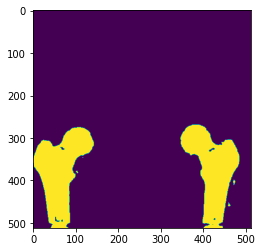

In [335]:
plt.imshow(pr)

In [287]:
nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(im_floodfill_inv, connectivity=8)
sizes = stats[1:, -1]; nb_components = nb_components - 1

min_size = 5000  

#your answer image
img2 = np.zeros((output.shape))
#for every component in the image, you keep it only if it's above min_size
for i in range(0, nb_components):
    if sizes[i] >= min_size:
        img2[output == i + 1] = 1
img2 = img2.astype('uint8')

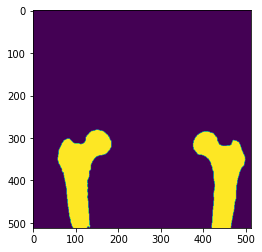

In [288]:
plt.imshow(img2)

In [252]:
import cv2

In [351]:
im_floodfill = pr.copy()
paded = np.zeros((im_floodfill.shape[0]+100, im_floodfill.shape[1]+100)).astype('uint8')
paded[50:-50, 50:-50] = im_floodfill
mask = np.zeros((paded.shape[0]+2, paded.shape[1]+2), np.uint8)

In [352]:
cv2.floodFill(paded, mask, (0,0), 255);

In [355]:
im_floodfill_inv = cv2.bitwise_not(paded)

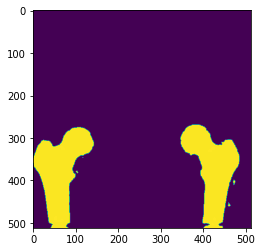

In [357]:
plt.imshow(im_floodfill_inv[50:-50, 50:-50])

In [363]:
pr0_lst = sorted(glob("xray/pr_all_eb3/*1.png"))
pr1_lst = sorted(glob("xray/pr_all_eb3/*2.png"))
pr2_lst = sorted(glob("xray/pr_all_eb3/*3.png"))
pr3_lst = sorted(glob("xray/pr_all_eb3/*4.png"))
pr4_lst = sorted(glob("xray/pr_all_eb3/*5.png"))

In [366]:
def toarr(path):
    return np.array(Image.open(path))

In [ ]:
for i in range(len(xray_dataset)):
    png = np.array(Image.open(png_lst[i]).convert("RGB"))
    mask = np.array(Image.open(mask_lst[i]))
    pr = toarr(pr1_lst[i])

    visualize(
            image=png, 
            ground_truth_mask= mask, 
            predicted_mask= pr
        )

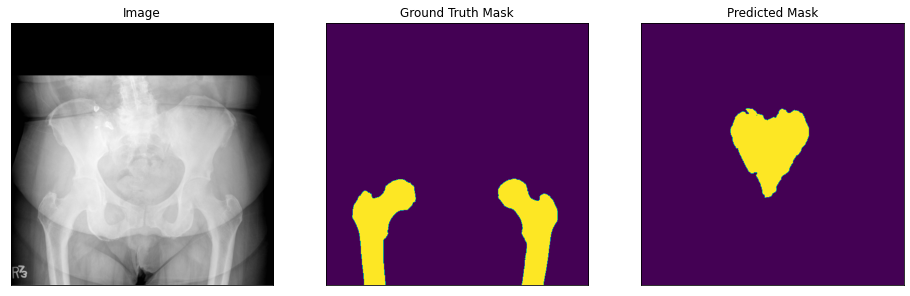

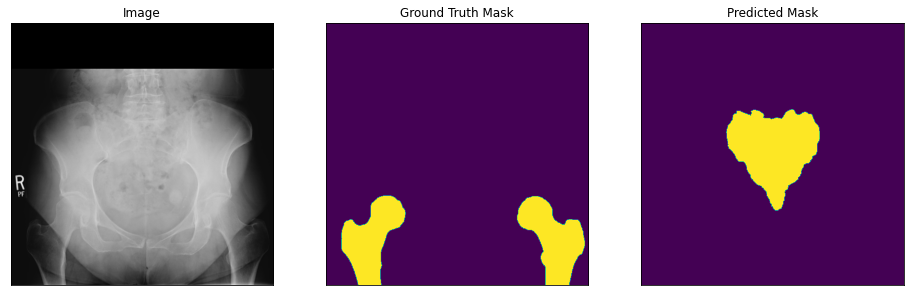

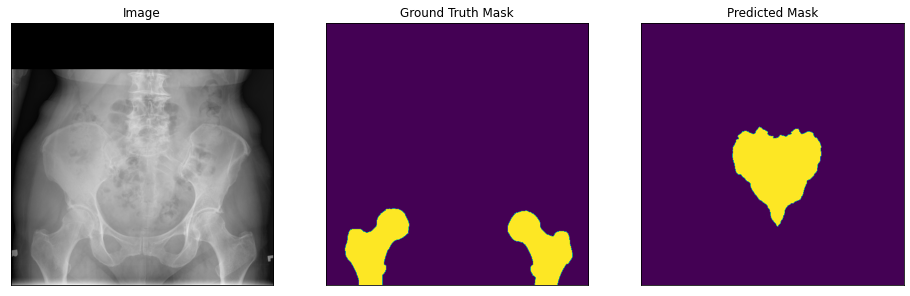

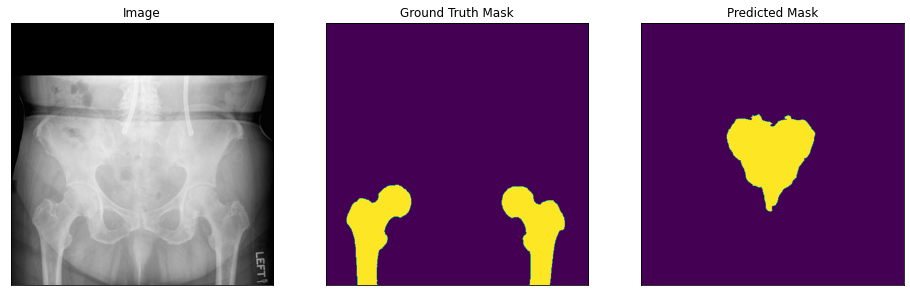

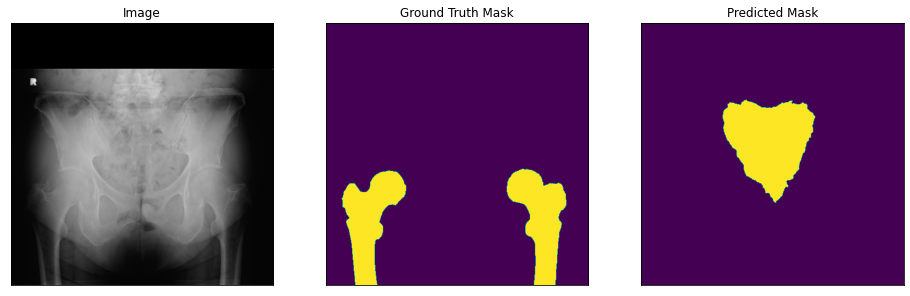

...

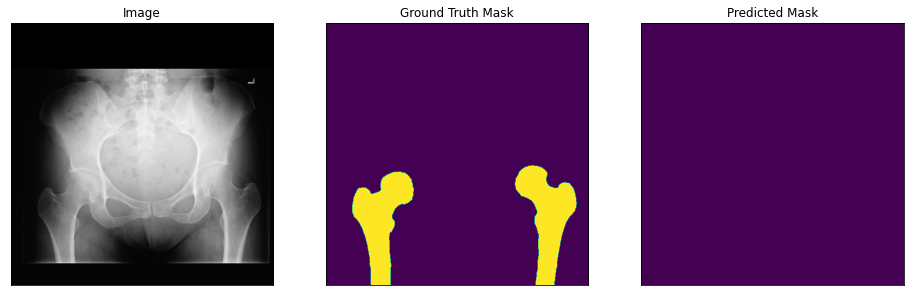

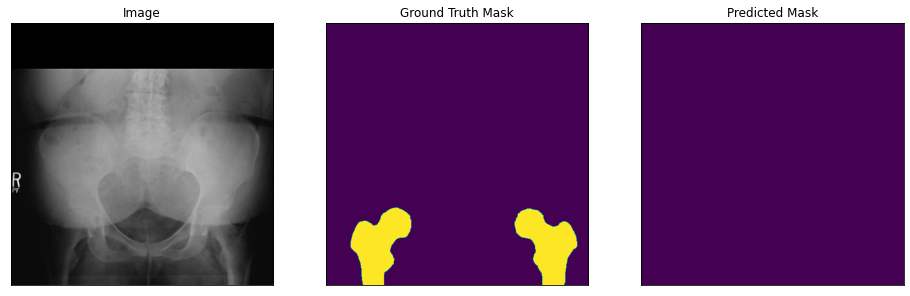

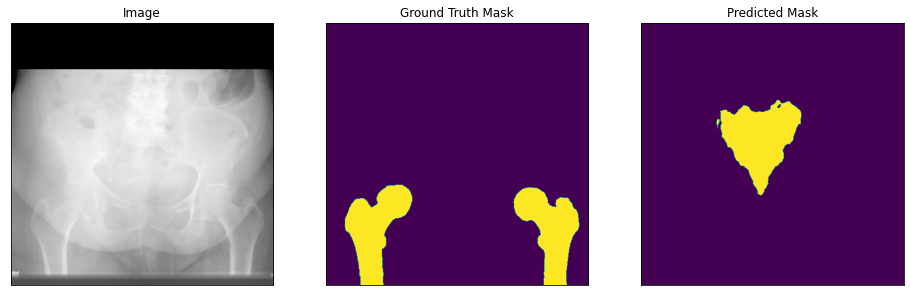

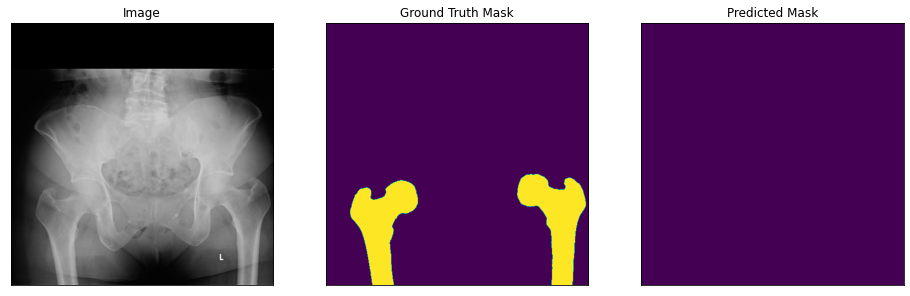

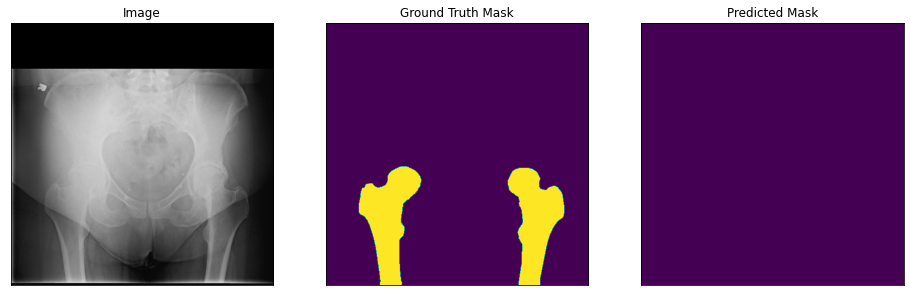

In [403]:
for i in range(len(xray_dataset)):
    png = np.array(Image.open(png_lst[i]).convert("RGB"))
    mask = np.array(Image.open(mask_lst[i]))
    pr = toarr(pr4_lst[i])

    visualize(
            image=png, 
            ground_truth_mask= mask, 
            predicted_mask= pr
        )

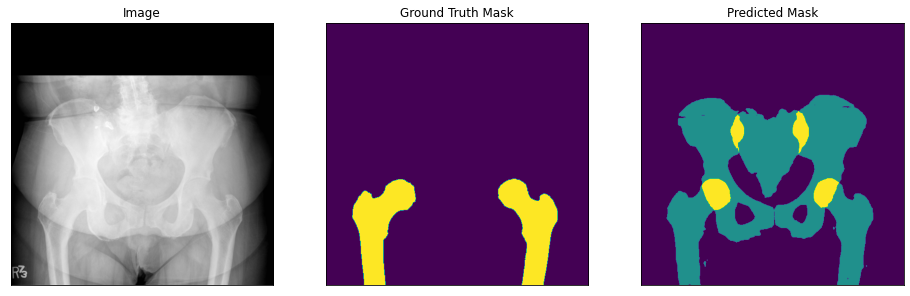

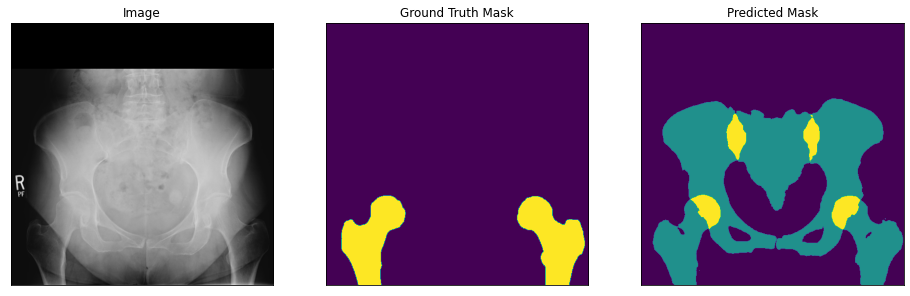

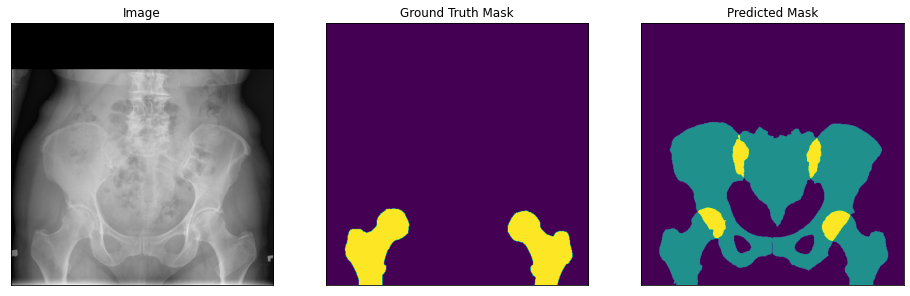

KeyboardInterrupt: 

In [369]:
for i in range(len(xray_dataset)):
    png = np.array(Image.open(png_lst[i]).convert("RGB"))
    mask = np.array(Image.open(mask_lst[i]))
    pr = toarr(pr0_lst[i])+toarr(pr1_lst[i])+toarr(pr2_lst[i])+toarr(pr3_lst[i])+toarr(pr4_lst[i])

    visualize(
            image=png, 
            ground_truth_mask= mask, 
            predicted_mask= pr
        )

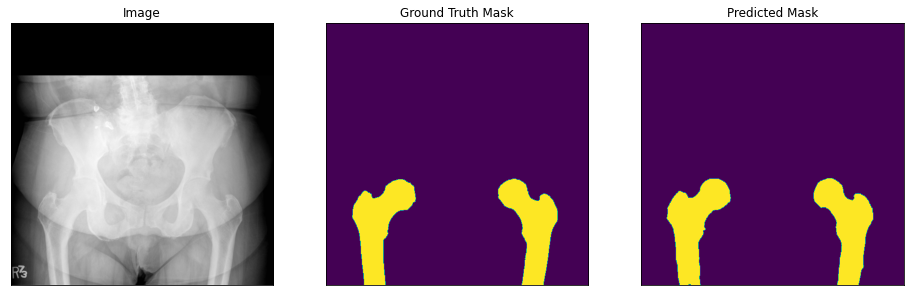

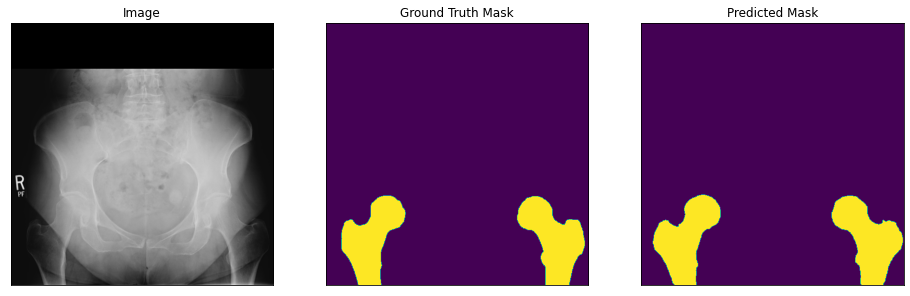

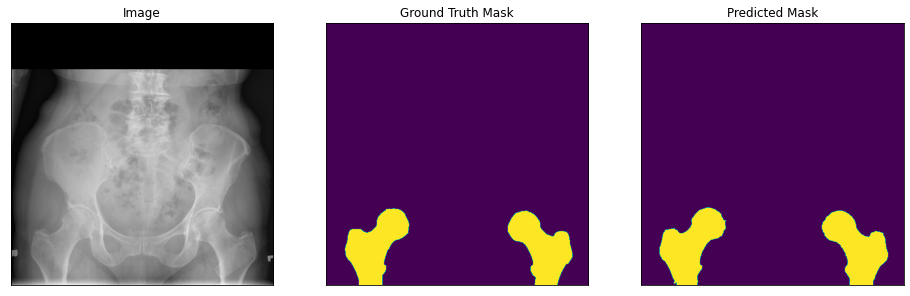

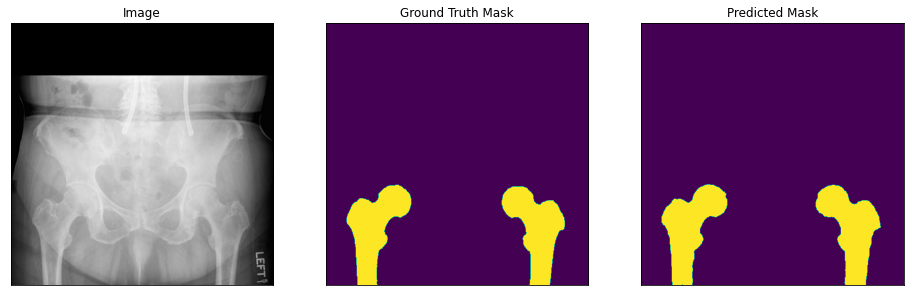

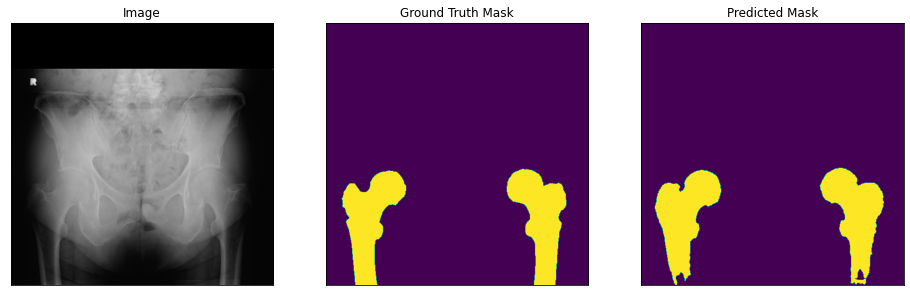

...

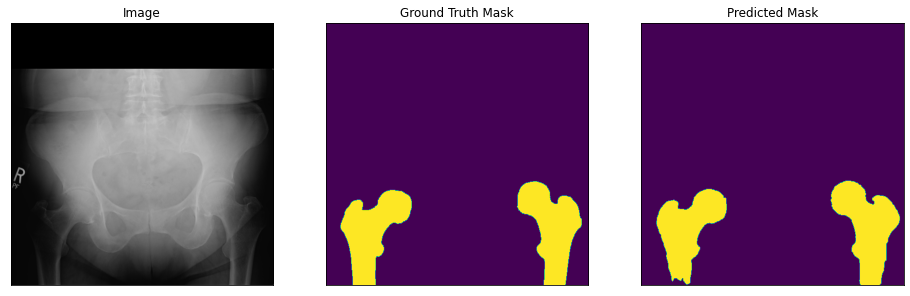

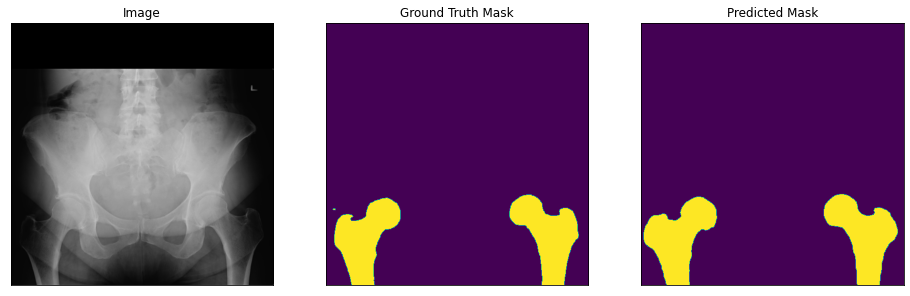

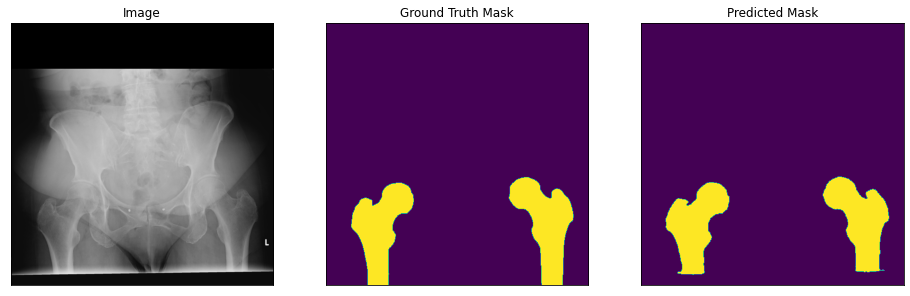

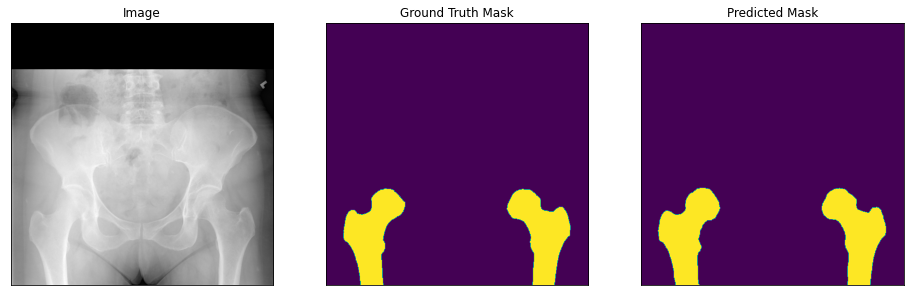

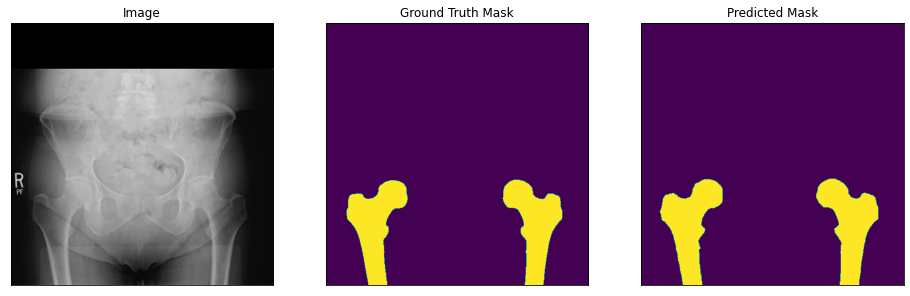

KeyboardInterrupt: 

In [360]:
for i in range(len(xray_dataset)):
    png = np.array(Image.open(png_lst[i]).convert("RGB"))
    mask = np.array(Image.open(mask_lst[i]))
    pr = np.array(Image.open(pr4_lst[i]))

    visualize(
            image=png, 
            ground_truth_mask= mask, 
            predicted_mask= pr
        )

In [64]:
image, gt_mask = xray_dataset[0]


x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
pr_mask = best_model.predict(x_tensor)
pr_mask = (pr_mask.squeeze().cpu().numpy().round())

In [399]:
len(xray_dataset)

1

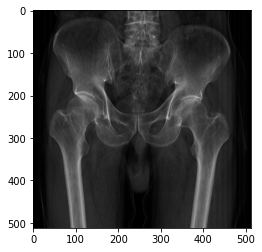

In [65]:
plt.imshow(image[0], cmap='gray')

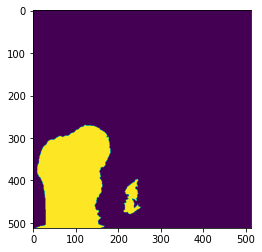

In [408]:
plt.imshow(pr_mask[0])

In [66]:
image, gt_mask = test_dataset[0]


x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
pr_mask = best_model.predict(x_tensor)
pr_mask = (pr_mask.squeeze().cpu().numpy().round())

In [67]:
RGBforLabel = {0:(0,0,255), 
               1:(0,255,0), 
               2:(255,0,0),
               3:(255,0,255),
               4:(255,255,0)}

# Blue -  Right Femur  
# Green - Left Femur  
# Red - Right Hip 
# Purple -  Left Hip
# Yellow - Sacrum

In [68]:
img_dict = dict()
for i in range (5):
    img_dict[i]=np.array(pr_mask[i]*255).astype(np.uint8)

In [69]:
import cv2

In [70]:
drr_arr = cv2.imread(xray_dataset.imgs_lst[0])

In [71]:
for i in RGBforLabel:
    contours, _ = cv2.findContours(img_dict[i], cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
    for c in contours:
        label = int(i)
        colour = RGBforLabel.get(label)
        cv2.drawContours(drr_arr,[c],-1,colour,3)

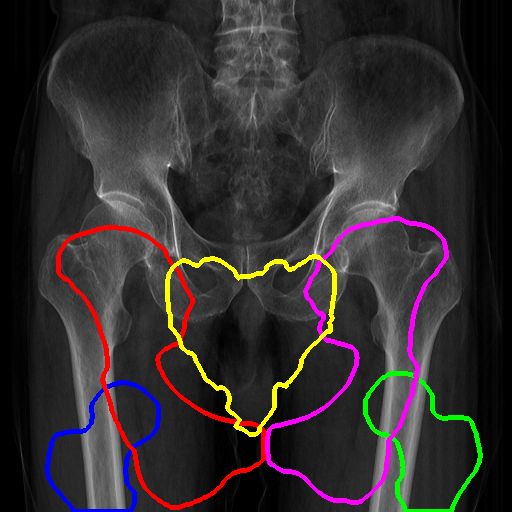

In [72]:
Image.fromarray(drr_arr)

In [97]:
# create test dataset
hipct_dataset = Dataset(
    csv_path,
    "xray", 
    mask_dir,  
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    classes=CLASSES,
    mode= 'xray'
)

hipct_dataloader = DataLoader(hipct_dataset)

In [112]:
th = 0.99
image, gt_mask = hipct_dataset[3]

x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
pr_mask = best_model.predict(x_tensor)
pr_mask = (pr_mask.squeeze().cpu().numpy() > th)

In [113]:
RGBforLabel = {0:(0,0,255), 
               1:(0,255,0), 
               2:(255,0,0),
               3:(255,0,255),
               4:(255,255,0)}

# Blue -  Right Femur  
# Green - Left Femur  
# Red - Right Hip 
# Purple -  Left Hip
# Yellow - Sacrum

In [114]:
img_dict = dict()
for i in range (5):
    img_dict[i]=np.array(pr_mask[i]*255).astype(np.uint8)

In [115]:
import cv2

In [123]:
drr_arr = cv2.imread(hipct_dataset.imgs_lst[0])

In [117]:
for i in RGBforLabel:
    contours, _ = cv2.findContours(img_dict[i], cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
    for c in contours:
        label = int(i)
        colour = RGBforLabel.get(label)
        cv2.drawContours(drr_arr,[c],-1,colour,3)

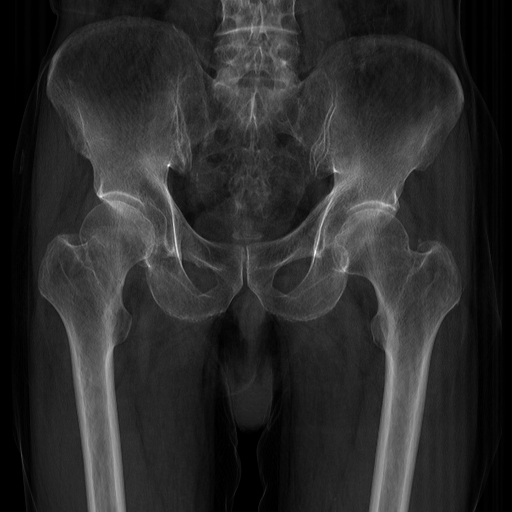

In [124]:
Image.fromarray(drr_arr)